#Natural Language Processing Assignment 1
---
* Varun S V
* CSE A
* CH.EN.U4CSE19050

##Question 1
---
1. Write regular Expression for the following:
<br>a. Any binary String
>e.g Strings like ***1,10,110001011001,101010101***
<br>should be accepted while strings like 0,00,Dog,153,Hello,Chennai26
<br>should be rejected
> 
<br>b. A Binary string that represents an even number
>e.g Strings like ***10,1110,11000110110***
<br>should be accepted while strings like 010,00001110,1,101,1101
<br>should be rejected


##Ans 1
---
1. >a. Regular Expression for Any Binary String that accepts 1,10,110001011001,101010101 is given as : <b><i>(1)<sup>+</sup> | (0 | 1)<sup>*</sup></b></i>
<br> b. The regular expression for a Binary String that represents an even number is given as : <b><i>(1) | (0|1)<sup>*</sup> | (0)</b></i>



In [110]:
import re

In [111]:
string1 = input("Enter the Expression : ")
ans1 = re.search("^1+[0-1]",string1)
if ans1:
  print("Yes, The String follows the Q1.a")
else:
  print("No, The String does not follow the Q1.a")

Enter the Expression : 11011010
Yes, The String follows the Q1.a


In [112]:
string2 = input("Enter the Expression : ")
ans2 = re.search("^1+[0-1]*0$",string2)
if ans2:
  print("Yes, The String follows the Q1.b")
else:
  print("No, The String does not follow the Q1.b")

Enter the Expression : 101101010
Yes, The String follows the Q1.b


##Question 2 
---
Use the assignment corpus and perform the following tasks
1. Find the number of characters, tokens in the text
2. Find the frequency of occurrenceof each distinct word in the corpus and show the top 10 frequently occurringwords
3. Show that thetop 10 frequently occurring words occur follow the Zipf’s law by plotting frequency against the rank. (Plot in logarithmic scale as the counts may be very high in the corpus).Check whether this plot closely approximates the straight line 1/n
4. Write a function to correct the spelling of a given word. [Hint: From this large corpus you can identify words that are 1 edit distance apart, 2 edit distances apartand 3 edit 

###Importing Libraries

In [113]:
from nltk.util import ngrams
from nltk.tokenize import word_tokenize as wt
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

###Functions 

In [114]:
#@title Function for Creation of Complex punctuation 
def listenhancer(lst,lists):
  # lst = ['a','b']
  # lists = ['c','d']
  res=[]
  # res.append(lst)
  # res.append(lists)
  for i in lst:
    res.append(i)
    for j in lists:
      res.append(j)
  for i in lst:
    for j in lists:
      res.append(i+j)
  return res

In [115]:
#@title Punctuations
from string import punctuation
puns = list(punctuation)
print(puns)
print(len(puns))
pun=[]
pun = listenhancer(puns,puns)
print(pun)
print(len(pun))

['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~']
32
['!', '!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~', '"', '!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~', '#', '!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~', '$', '!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~', '%', '!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~', '&',

In [116]:
from nltk.tokenize import word_tokenize as wt 
def cleaning(Datas):
  lower = []
  tokens = []
  cleaned_tokens=[]
  tokens = wt(Datas)
  for i in tokens:
    lower.append(i.lower())
  cleaned_tokens = [token for token in lower if token not in pun]
  new_data = ''
  for i in cleaned_tokens:
    new_data+=i
    new_data+=' '
  return new_data

  

In [117]:
def extract_ngrams(data,num):
  n_grams = ngrams(nltk.word_tokenize(data),num)
  return [' '.join(grams) for grams in n_grams]

###Answer 2.a

In [118]:
data = open("/content/assignment_corpus.txt","r",encoding='utf8').read()
data.lower()

'the project gutenberg ebook of the adventures of sherlock holmes\nby sir arthur conan doyle\n(#15 in our series by sir arthur conan doyle)\n\ncopyright laws are changing all over the world. be sure to check the\ncopyright laws for your country before downloading or redistributing\nthis or any other project gutenberg ebook.\n\nthis header should be the first thing seen when viewing this project\ngutenberg file.  please do not remove it.  do not change or edit the\nheader without written permission.\n\nplease read the "legal small print," and other information about the\nebook and project gutenberg at the bottom of this file.  included is\nimportant information about your specific rights and restrictions in\nhow the file may be used.  you can also find out about how to make a\ndonation to project gutenberg, and how to get involved.\n\n\n**welcome to the world of free plain vanilla electronic texts**\n\n**ebooks readable by both humans and by computers, since 1971**\n\n*****these ebooks 

In [119]:
cleaned_data=cleaning(data)

In [120]:
monograms = extract_ngrams(data,1)
len(monograms)

1288653

In [135]:
#@title ANS a
print("ANS 1 : The totla number of Tokens in the document = "+str(len(monograms)))

ANS 1 : The totla number of Tokens in the document = 1288653


####Result:
---
From this ans we can get the information about the number of total tokens present in the corpus and can then use this information for the proving of Zipf's law as well as prediction of a word from the given word.

###Answer 2.b

In [122]:
fdd = nltk.FreqDist(monograms)

In [123]:
fdd.tabulate()

                                                 ,                                                the                                                  .                                                 of                                                and                                                 to                                                  a                                                 in                                                 ''                                                 ``                                               that                                                was                                                 he                                                 is                                                his                                               with                                                 it                                                  I                                                 as                                

In [124]:
#@title ANS b
print("ANS 2 : The Frequency Distribution of each words : \n")
str(fdd.pprint())

ANS 2 : The Frequency Distribution of each words : 

FreqDist({',': 77142, 'the': 72266, '.': 49214, 'of': 39705, 'and': 36850, 'to': 28176, 'a': 20063, 'in': 19871, "''": 13682, '``': 12426, ...})


'None'

####Result:
---
From this ans we can get the frequency distribution for each words separately, which later can be used to prove the Zipf's Law.

###Answer 2.c

In [125]:
import re
from operator import itemgetter    
freq = {}
frequency = {}
words = re.findall(r'(\b[A-Za-z][a-z]{2,9}\b)', data)
 
for word in words:
    count = frequency.get(word,0)
    frequency[word] = count + 1
     
for key, value in reversed(sorted(frequency.items(), key = itemgetter(1))):
  freq[key]=value

In [126]:
from itertools import islice

def take(n, iterable):
    "Return first n items of the iterable as a list"
    return list(islice(iterable, n))


In [136]:
#@title ANS c
freqs = []
wrds=[]
ranks=[]
rank = {}
rank_no = 1
for i in take(10,freq):
  rank[rank_no] = i
  wrds.append(i)
  ranks.append(rank_no)
  rank_no+=1
  freqs.append(freq[i])
  print(i+" : "+str(freq[i]))

the : 72282
and : 36891
that : 11976
was : 11366
his : 9618
with : 9490
had : 7332
The : 7243
for : 6632
not : 6461


In [128]:
freqs

[72282, 36891, 11976, 11366, 9618, 9490, 7332, 7243, 6632, 6461]

In [129]:
ranks

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

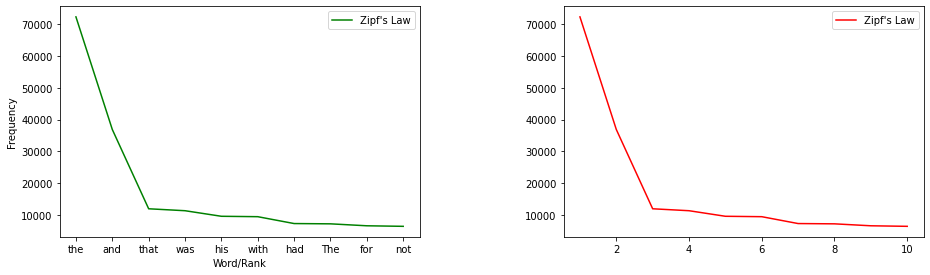

In [137]:
import matplotlib.pyplot as plt
plt.subplots_adjust(left=2,
                    bottom=0.1, 
                    right=4, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)


plt.xlabel("Word")
plt.ylabel("Frequency")
plt.subplot(1,2,1)
plt.plot(wrds,freqs,label="Zipf's Law",color="green")
plt.legend()
plt.xlabel("Word/Rank")
plt.ylabel("Frequency")
plt.subplot(1,2,2)
plt.plot(ranks,freqs,label="Zipf's Law",color="red")
plt.legend()
plt.show()

####*Result* : 
---
  From the above graphs we can get a relation of **f** being ***inversely proportional to r*** where ***f*** represents ***Frequency*** and ***r*** represents ***Rank***.

###Answer 2.d

In [131]:
def correct_misspelled(misspelled):
  suggestions = []
  for i in words:
    if ((misspelled in i) or (i in misspelled)):
      if abs(len(misspelled or i) - len(misspelled and i)) <=3:
        if (i or misspelled) not in suggestions:
          suggestions.append(i or misspelled)
  return suggestions

In [132]:
def sort_by_rank(suggestion):
  new_suggestions=[]
  for i in range(len(suggestion)):
    maxs = freq[suggestion[i]]
    maxstr = suggestion[i]
    for j in range(i,len(suggestion)):
      if maxs < freq[suggestion[j]]:
        maxs = freq[suggestion[j]]
        maxstr = suggestion[j]
    new_suggestions.append(maxstr)
    return new_suggestions

In [133]:
#@title ANS d
string = input("Enter a word : ")
print("Suggestions : \n")
print(correct_misspelled(string))

Enter a word : Tha
Suggestions : 

['That', 'Thank', 'Thames', 'Thanks', 'Thabor']


In [134]:
print("Suggestion Based on Rank : ")
print(sort_by_rank(correct_misspelled(string)))

Suggestion Based on Rank : 
['That']


####Result: 
---
From this one we are able to get all the words containing the searched word and will suggest the word which is closest to the misspelled words.